<a href="https://colab.research.google.com/github/branimirprodic/PPPO2023-IT28-2018-BranimirProdic-Klasifikacija/blob/main/Lego%20dataset%20classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Student: Branimir Prodić IT28-2018

Predmet: Principi prezentacije i prepoznavanje oblika

# **Klasifikacija**

Klasifikacija je vrsta nadgledanog učenja čiji je cilj predvideti kategoričke klasne oznake novih instanci na osnovu ranijih opažanja, odnosno ulaza. U mašinskom učenju klasifikacija predstavlja zadatak gde se za svaki ulazni podatak predviđa klasa kojoj taj podatak najverovatnije pripada.

Kako bi se klasifikacija obavila uspešno, potreban je velik broj ulaznih podataka koji služe za treniranje neuronske mreže koja će se koristiti za klasifikaciju. Ulazni podaci moraju biti raznovrsni i moraju obuhvatati primere iz svih mogućih izlaznih klasa kako bi neurnoska mreža bila što bolje istrenirana.

# **Set podataka**
U ovom projektu, korišćen je set podataka koji sadrži fotografije lego figura različitih fiktivnih likova, a cilj klasifikacije je odrediti kojoj klasi pripadaju, odnosno koji je lik sa slike. Korišćen algoritam klasifikacije je DenseNet121.

# **Učitavanje biblioteka i funkcija**

Učitavanje potrebnih biblioteka i njihovih funkcija za dalju realizaciju projekta.

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import cv2

import tensorflow as tf
from tensorflow.keras.applications import mobilenet_v2 as tf_mobilenet_v2
from tensorflow.keras import layers,models
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Flatten,Dropout, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import load_img,img_to_array

from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
import matplotlib.image as mpimg


# **Učitavanje podataka**

Podaci se učitavaju sa lokalnog foldera. Nakon što podaci bivaju učitani, ubacuju se u listu i prikazuju se.

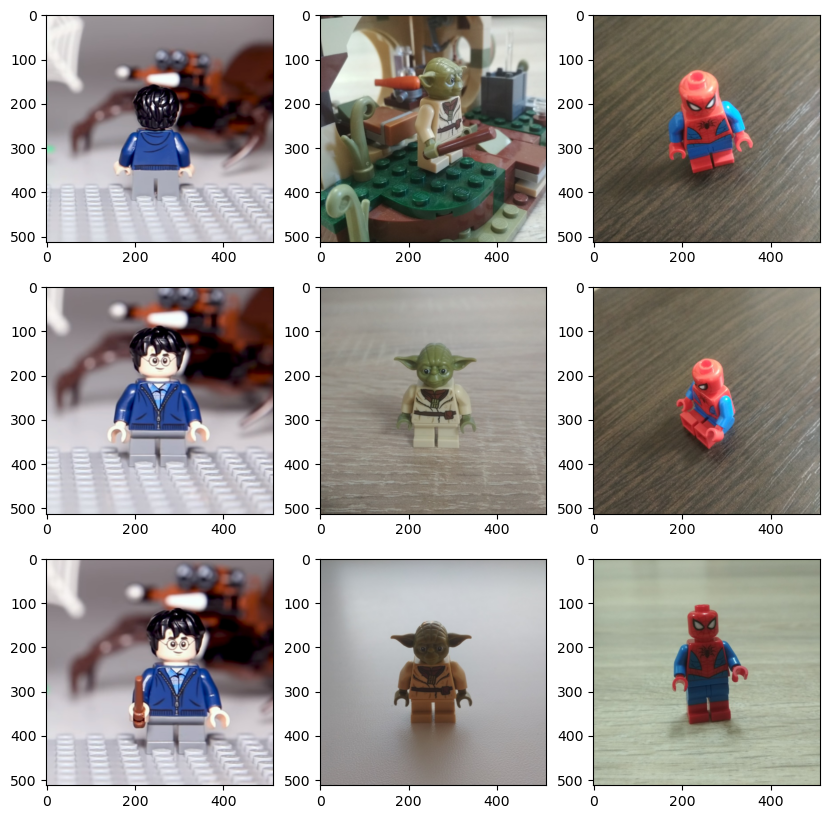

In [ ]:
images = [[],[],[]]
index = ['001', '002', '003']
folder_path = r"E:\Fakultet\Cetvrta godina\8. semestar\Principi prezentacije i prepoznavanje oblika"

for i in range(3):
    images[i].append(mpimg.imread(folder_path + '\harry-potter/0001/' + index[i] + '.jpg'))
    images[i].append(mpimg.imread(folder_path + '\star-wars/0001/' + index[i] + '.jpg'))
    images[i].append(mpimg.imread(folder_path + '\marvel/0001/' + index[i] + '.jpg'))

fig, axs = plt.subplots(3,3, figsize=(10,10))

for i in range(3):
    for j in range(3):
        axs[i, j].imshow(images[i][j])

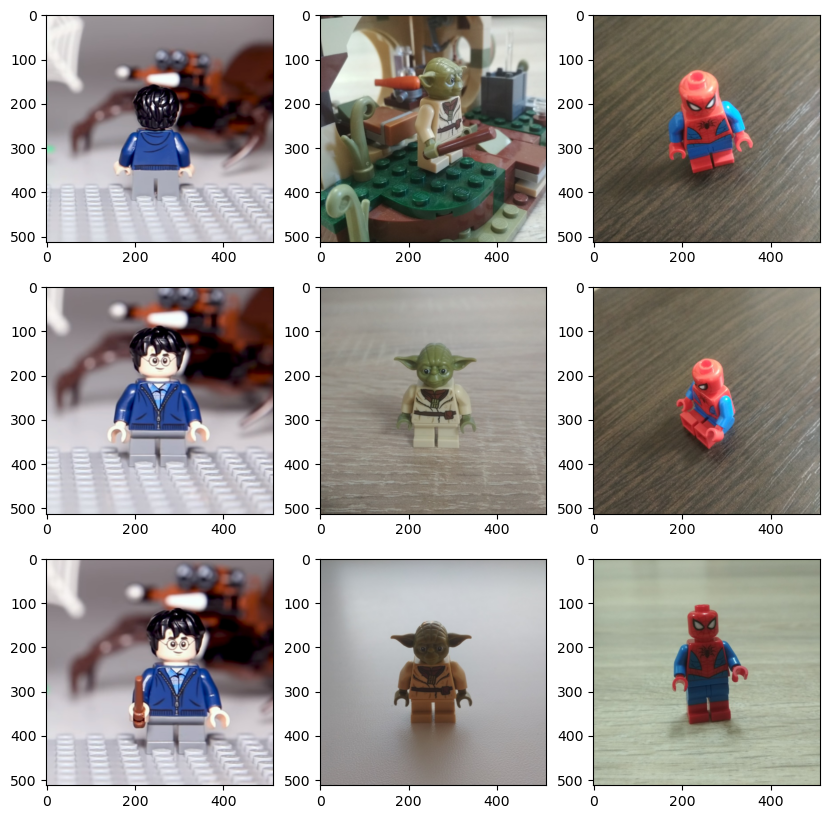

In [ ]:
images = [[],[],[]]
index = ['001', '002', '003']
folder_path = 'E:\Fakultet\Cetvrta godina\8. semestar\Principi prezentacije i prepoznavanje oblika'

for i in range(3):
    images[i].append(mpimg.imread(folder_path + '\harry-potter/0001/' + index[i] + '.jpg'))
    images[i].append(mpimg.imread(folder_path + '\star-wars/0001/' + index[i] + '.jpg'))
    images[i].append(mpimg.imread(folder_path + '\marvel/0001/' + index[i] + '.jpg'))

fig, axs = plt.subplots(3,3, figsize=(10,10))

for i in range(3):
    for j in range(3):
        axs[i, j].imshow(images[i][j])

In [ ]:
index_df = pd.read_csv(folder_path +'\index.csv')
index_df


,path,class_id
0,marvel/0001/001.jpg,1
1,marvel/0001/002.jpg,1
2,marvel/0001/003.jpg,1
3,marvel/0001/004.jpg,1
4,marvel/0001/005.jpg,1
...,...,...
366,star-wars/0017/006.jpg,38
367,star-wars/0017/007.jpg,38
368,star-wars/0017/008.jpg,38
369,star-wars/0017/009.jpg,38


In [ ]:
metadata_df = pd.read_csv(folder_path +'\metadata.csv', encoding='latin-1')
metadata_df


,class_id,lego_ids,lego_names,minifigure_name
0,1,[76115],['Spider Mech vs. Venom'],SPIDER-MAN
1,2,[76115],['Spider Mech vs. Venom'],VENOM
2,3,[76115],['Spider Mech vs. Venom'],AUNT MAY
3,4,[76115],['Spider Mech vs. Venom'],GHOST SPIDER
4,5,[75208],"[""Yoda's Hut""]",YODA
5,6,[75208],"[""Yoda's Hut""]",LUKE SKYWALKER
6,7,[75208],"[""Yoda's Hut""]",R2-D2
7,8,[75199],"[""General Grievous' Combat Speeder""]",MACE WINDU
8,9,[75199],"[""General Grievous' Combat Speeder""]",GENERAL GRIEVOUS
9,10,[75264],"[""Kylo Ren's Shuttle Microfighter""]",KYLO REN


In [ ]:
data_df = pd.merge(index_df, metadata_df[['class_id', 'minifigure_name']], on='class_id')
data_df

,path,class_id,minifigure_name
0,marvel/0001/001.jpg,1,SPIDER-MAN
1,marvel/0001/002.jpg,1,SPIDER-MAN
2,marvel/0001/003.jpg,1,SPIDER-MAN
3,marvel/0001/004.jpg,1,SPIDER-MAN
4,marvel/0001/005.jpg,1,SPIDER-MAN
...,...,...,...
366,star-wars/0017/006.jpg,38,BOBA FETT
367,star-wars/0017/007.jpg,38,BOBA FETT
368,star-wars/0017/008.jpg,38,BOBA FETT
369,star-wars/0017/009.jpg,38,BOBA FETT


In [ ]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 371 entries, 0 to 370
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   path             371 non-null    object
 1   class_id         371 non-null    int64 
 2   minifigure_name  371 non-null    object
dtypes: int64(1), object(2)
memory usage: 11.6+ KB


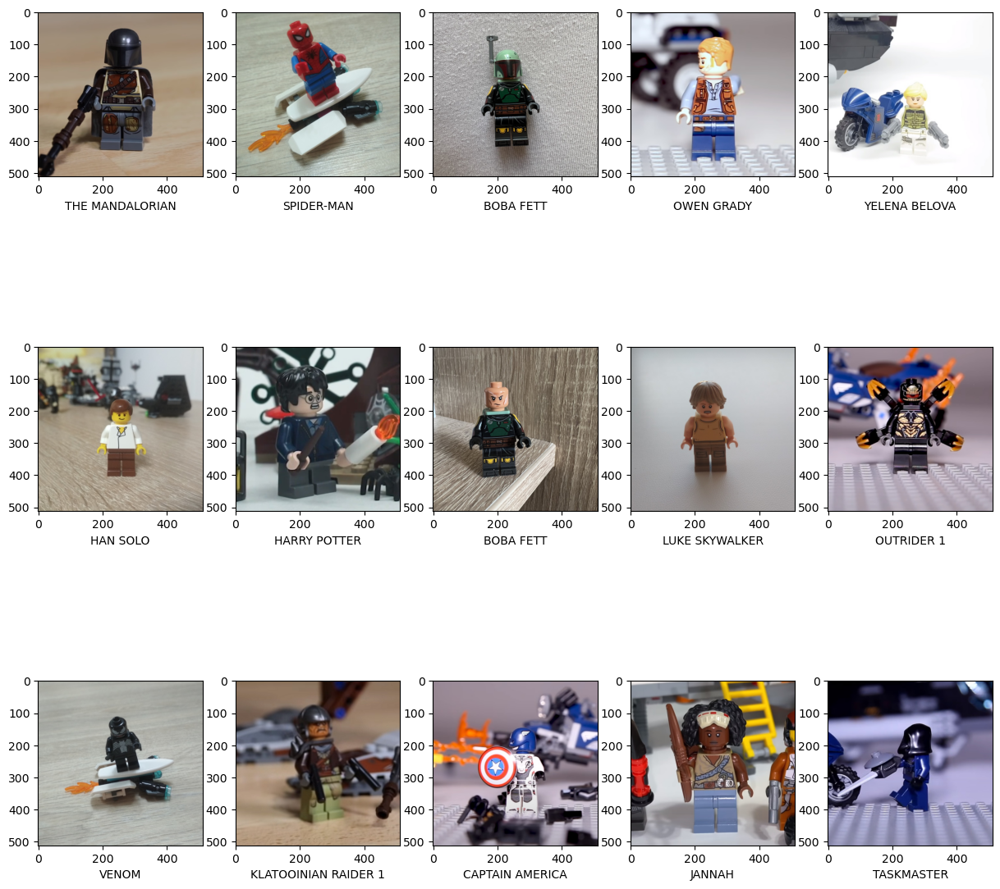

In [ ]:
sample_df=data_df.sample(20)
folder_path='E:\\Fakultet\\Cetvrta godina\\8. semestar\\Principi prezentacije i prepoznavanje oblika'

plt.figure(figsize=(15,15))
i=0
for i in range(15):
    plt.subplot(3,5,i+1)
    plt.grid(False)
    img = load_img(folder_path + '\\' + sample_df['path'].values[i])
    plt.imshow(img)
    plt.xlabel(sample_df['minifigure_name'].values[i])
    i += 1
plt.show()

In [ ]:
for path in sample_df['path']:
    print(path)

star-wars/0007/005.jpg
marvel/0001/008.jpg
star-wars/0017/004.jpg
jurassic-world/0001/005.jpg
marvel/0009/011.jpg
star-wars/0012/008.jpg
harry-potter/0001/011.jpg
star-wars/0017/008.jpg
star-wars/0002/003.jpg
marvel/0012/004.jpg
marvel/0002/008.jpg
star-wars/0009/004.jpg
marvel/0011/006.jpg
star-wars/0011/007.jpg
marvel/0010/007.jpg
star-wars/0002/004.jpg
star-wars/0007/007.jpg
marvel/0004/009.jpg
harry-potter/0001/003.jpg
marvel/0003/008.jpg


# **Trening i test podaci**
Prvo test_df učitava CSV fajl, a iz njega, u x_test kao ulazne testne podatke učitavaju se obeležja osim class_id, dok izlazni testni podaci y_test sadrže obeležje class_id. Prikazani X_Test i y_test.

In [ ]:
test_df = pd.read_csv(folder_path + '\\test.csv')
X_test = test_df.drop(columns = ['class_id'])
X_test


,path
0,test/001.jpg
1,test/002.jpg
2,test/003.jpg
3,test/004.jpg
4,test/005.jpg
...,...
74,test/075.jpg
75,test/076.jpg
76,test/077.jpg
77,test/078.jpg


In [ ]:
y_test = test_df['class_id']
y_test


0     32
1     32
2     32
3     32
4      1
      ..
74    37
75    37
76    38
77    38
78    38
Name: class_id, Length: 79, dtype: int64

**Vrši se spajanje test_df i metadata_df po class_id - u. Prikaz novonastale tabele.**

In [ ]:
test_actual_df = pd.merge(test_df, metadata_df[['class_id', 'minifigure_name']], on='class_id')
test_actual_df = test_actual_df.sort_values('path')
test_actual_df

,path,class_id,minifigure_name
0,test/001.jpg,32,JANNAH
1,test/002.jpg,32,JANNAH
2,test/003.jpg,32,JANNAH
3,test/004.jpg,32,JANNAH
4,test/005.jpg,1,SPIDER-MAN
...,...,...,...
74,test/075.jpg,37,OBI-WAN KENOBI
75,test/076.jpg,37,OBI-WAN KENOBI
76,test/077.jpg,38,BOBA FETT
77,test/078.jpg,38,BOBA FETT


In [ ]:
X_data = data_df.drop(columns = ['class_id'])
X_data

,path,minifigure_name
0,marvel/0001/001.jpg,SPIDER-MAN
1,marvel/0001/002.jpg,SPIDER-MAN
2,marvel/0001/003.jpg,SPIDER-MAN
3,marvel/0001/004.jpg,SPIDER-MAN
4,marvel/0001/005.jpg,SPIDER-MAN
...,...,...
366,star-wars/0017/006.jpg,BOBA FETT
367,star-wars/0017/007.jpg,BOBA FETT
368,star-wars/0017/008.jpg,BOBA FETT
369,star-wars/0017/009.jpg,BOBA FETT


In [ ]:
y_data = data_df['class_id']
y_data


0       1
1       1
2       1
3       1
4       1
       ..
366    38
367    38
368    38
369    38
370    38
Name: class_id, Length: 371, dtype: int64

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X_data, y_data, test_size=0.20, random_state= 8)

**Urađeni su resize i normalizacija validacionih podataka. Podaci prikazani od 0-1.**

In [ ]:
X_train_converted = np.zeros((X_train.shape[0], 224, 224, 3))
X_train["path"] = "E:\\Fakultet\\Cetvrta godina\\8. semestar\\Principi prezentacije i prepoznavanje oblika\\" + X_train["path"]

for i in range(X_train.shape[0]):
    image = cv2.imread(X_train["path"].values[i])
    image = cv2.resize(image, dsize=(224,224))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    X_train_converted[i] = image/255

y_train_converted = np.array(y_train)-1

In [ ]:
X_train_converted[0]

array([[[0.69803922, 0.68627451, 0.66666667],
        [0.69411765, 0.68235294, 0.6627451 ],
        [0.69411765, 0.68235294, 0.65490196],
        ...,
        [0.59215686, 0.54509804, 0.49019608],
        [0.59607843, 0.54901961, 0.49411765],
        [0.59215686, 0.54509804, 0.49019608]],

       [[0.68627451, 0.6745098 , 0.65490196],
        [0.68627451, 0.6745098 , 0.64705882],
        [0.68235294, 0.67058824, 0.64313725],
        ...,
        [0.60392157, 0.55686275, 0.50196078],
        [0.60392157, 0.55686275, 0.50196078],
        [0.59607843, 0.54901961, 0.49411765]],

       [[0.67843137, 0.6627451 , 0.63921569],
        [0.67843137, 0.6627451 , 0.63921569],
        [0.6745098 , 0.65490196, 0.63137255],
        ...,
        [0.6       , 0.55294118, 0.49803922],
        [0.60392157, 0.55686275, 0.50196078],
        [0.6       , 0.55294118, 0.49803922]],

       ...,

       [[0.58431373, 0.55686275, 0.52156863],
        [0.66666667, 0.63529412, 0.61176471],
        [0.63529412, 0

In [ ]:
X_val_converted = np.zeros((X_val.shape[0], 224, 224, 3))
X_val["path"] = "E:\\Fakultet\\Cetvrta godina\\8. semestar\\Principi prezentacije i prepoznavanje oblika\\" + X_val["path"]

for i in range(X_val.shape[0]):
    image = cv2.imread(X_val["path"].values[i])
    image = cv2.resize(image, dsize=(224,224))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    X_val_converted[i] = image/255

y_val_converted = np.array(y_val)-1

In [ ]:
X_val_converted[0]


array([[[0.37254902, 0.34117647, 0.2745098 ],
        [0.38823529, 0.34901961, 0.28235294],
        [0.38431373, 0.34901961, 0.28235294],
        ...,
        [0.56078431, 0.54901961, 0.48235294],
        [0.56470588, 0.54901961, 0.48235294],
        [0.55686275, 0.54509804, 0.47843137]],

       [[0.39215686, 0.36470588, 0.29411765],
        [0.41176471, 0.38431373, 0.31372549],
        [0.41176471, 0.37647059, 0.30980392],
        ...,
        [0.56470588, 0.55294118, 0.48627451],
        [0.57254902, 0.56078431, 0.49411765],
        [0.56862745, 0.55686275, 0.49019608]],

       [[0.41960784, 0.39215686, 0.32156863],
        [0.41176471, 0.38431373, 0.31372549],
        [0.40392157, 0.37647059, 0.30588235],
        ...,
        [0.56470588, 0.55294118, 0.48627451],
        [0.58039216, 0.56862745, 0.50196078],
        [0.56862745, 0.55686275, 0.49019608]],

       ...,

       [[0.30980392, 0.27058824, 0.23529412],
        [0.3372549 , 0.29803922, 0.2627451 ],
        [0.31372549, 0

In [ ]:
X_test_converted = np.zeros((X_test.shape[0], 224, 224, 3))
X_test["path"] = "E:\\Fakultet\\Cetvrta godina\\8. semestar\\Principi prezentacije i prepoznavanje oblika\\" + X_test["path"]

for i in range(X_test.shape[0]-1):
    image = cv2.imread(X_test["path"].values[i])
    image = cv2.resize(image, dsize=(224,224))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    X_test_converted[i] = image/255

y_test_converted = np.array(y_test)

# **DenseNet121**
DenseNet je jedno od novih otkrića u neuronskim mrežama za vizuelno prepoznavanje objekata. DenseNet je prilično sličan ResNetu sa nekim fundamentalnim razlikama. ResNet koristi aditivni metod (+) koji spaja prethodni sloj (identitet) sa budućim slojem, dok DenseNet spaja (.) izlaz prethodnog sloja sa budućim slojem.

In [ ]:
from tensorflow.keras.applications import DenseNet121
dense_net = tf.keras.applications.DenseNet121()

dense_net_layer=Dropout(0.5)(dense_net.layers[-2].output)
number_of_classes = len(data_df['class_id'].unique())

last_layer = Dense(number_of_classes, activation="softmax")(dense_net_layer)
model = Model(dense_net.input, last_layer)

model.compile(loss='sparse_categorical_crossentropy',
              optimizer=Adam(0.0001),
              metrics=['accuracy'])


33188688/33188688 [==============================] - 1s 0us/step


In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint

checkpoint = ModelCheckpoint(filepath='model.h5', monitor="val_accuracy", save_best_only=True, verbose=1)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

early_stopping = EarlyStopping(monitor='val_accuracy', mode='max', patience=5,  restore_best_weights=True)

In [ ]:
hist=model.fit(
    X_train_converted,
    y_train_converted,
    epochs=50,
    validation_data=(X_val_converted, y_val_converted),
    shuffle=True,
    batch_size=10,
    callbacks=[checkpoint, early_stopping]
)


Epoch 1/50
30/30 [==============================] - ETA: 0s - loss: 4.2378 - accuracy: 0.0405
Epoch 1: val_accuracy improved from -inf to 0.09333, saving model to model.h5


C:\Users\brani\AppData\Roaming\Python\Python39\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


30/30 [==============================] - 119s 3s/step - loss: 4.2378 - accuracy: 0.0405 - val_loss: 3.3097 - val_accuracy: 0.0933
Epoch 2/50
30/30 [==============================] - ETA: 0s - loss: 2.6012 - accuracy: 0.3041
Epoch 2: val_accuracy improved from 0.09333 to 0.41333, saving model to model.h5
30/30 [==============================] - 83s 3s/step - loss: 2.6012 - accuracy: 0.3041 - val_loss: 2.5058 - val_accuracy: 0.4133
Epoch 3/50
30/30 [==============================] - ETA: 0s - loss: 1.4358 - accuracy: 0.6385
Epoch 3: val_accuracy improved from 0.41333 to 0.49333, saving model to model.h5
30/30 [==============================] - 82s 3s/step - loss: 1.4358 - accuracy: 0.6385 - val_loss: 2.0203 - val_accuracy: 0.4933
Epoch 4/50
30/30 [==============================] - ETA: 0s - loss: 0.8930 - accuracy: 0.8311
Epoch 4: val_accuracy improved from 0.49333 to 0.68000, saving model to model.h5
30/30 [==============================] - 82s 3s/step - loss: 0.8930 - accuracy: 0.8311 

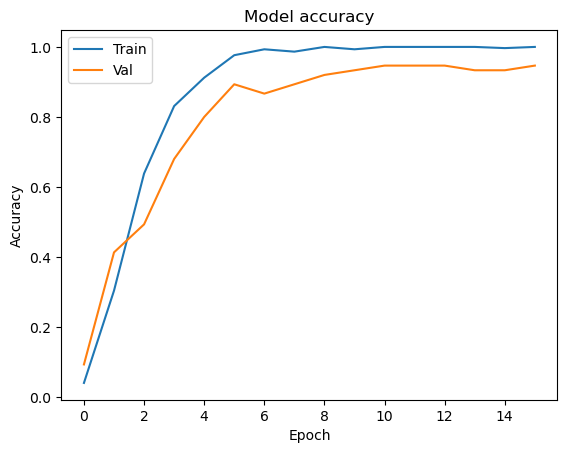

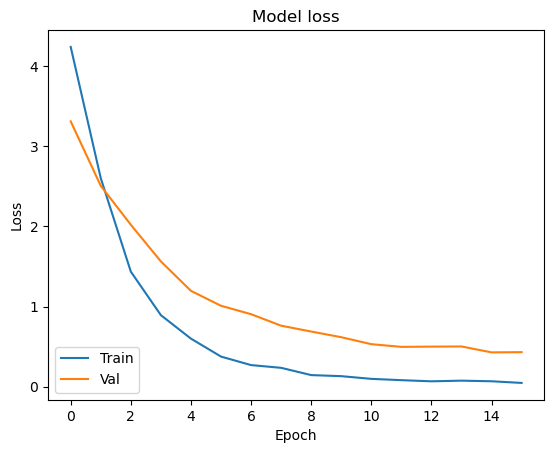

In [ ]:
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='lower left')
plt.show()

In [ ]:
from tensorflow.keras import models as tf_models

model = tf_models.load_model('model.h5')

**Iznad figurice piše predviđena vrednost, a ispod slike piše prava vrednost, odnosno klasa kojoj figurica pripada.**

1/1 [==============================] - 2s 2s/step
Class: 32 Minifigure: JANNAH


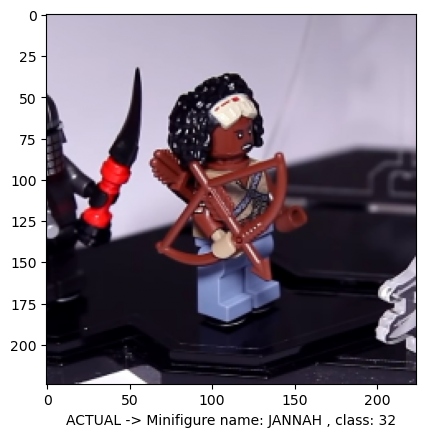

1/1 [==============================] - 0s 121ms/step
Class: 32 Minifigure: JANNAH


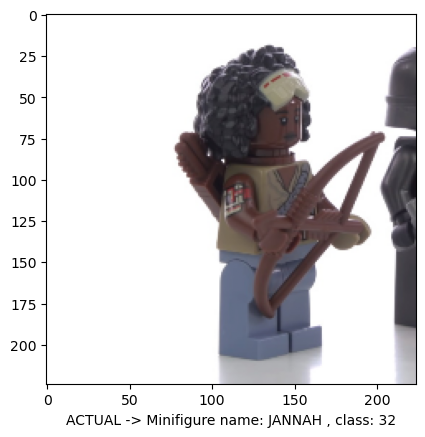

1/1 [==============================] - 0s 121ms/step
Class: 32 Minifigure: JANNAH


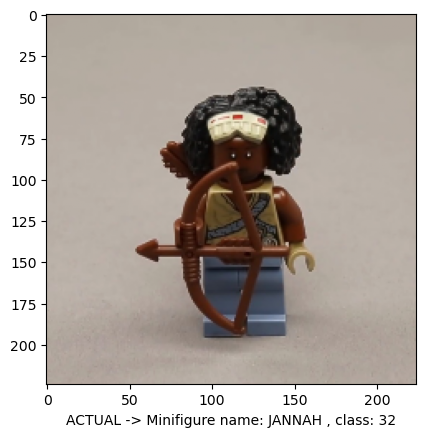

1/1 [==============================] - 0s 137ms/step
Class: 32 Minifigure: JANNAH


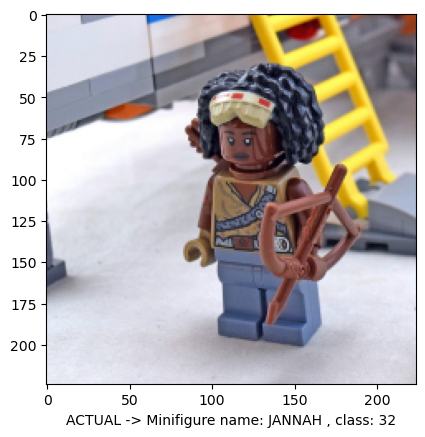

1/1 [==============================] - 0s 134ms/step
Class: 31 Minifigure: IRON MAN MK 50


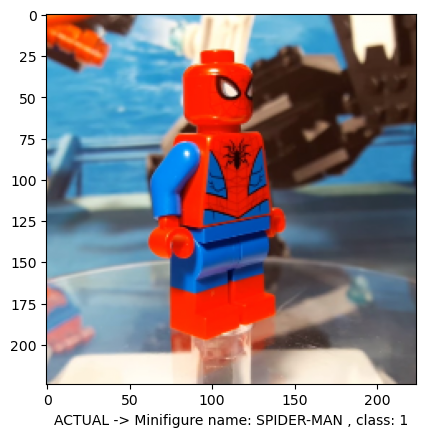

1/1 [==============================] - 0s 138ms/step
Class: 26 Minifigure: OWEN GRADY


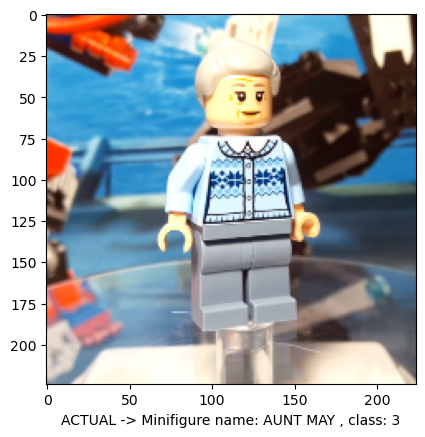

1/1 [==============================] - 0s 132ms/step
Class: 31 Minifigure: IRON MAN MK 50


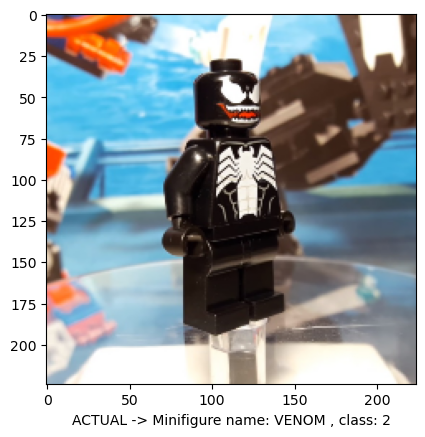

1/1 [==============================] - 0s 138ms/step
Class: 4 Minifigure: GHOST SPIDER


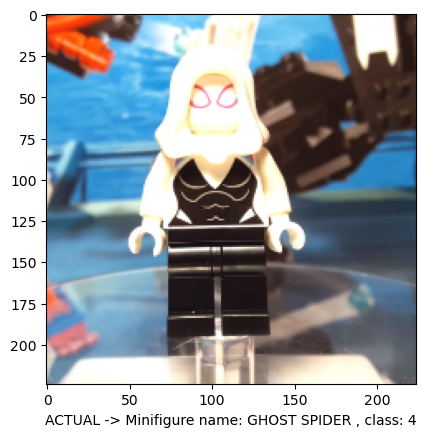

1/1 [==============================] - 0s 132ms/step
Class: 31 Minifigure: IRON MAN MK 50


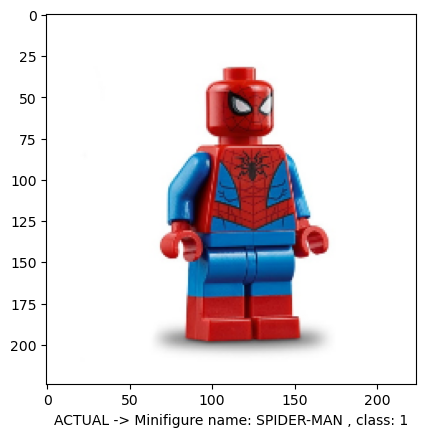

1/1 [==============================] - 0s 127ms/step
Class: 3 Minifigure: AUNT MAY


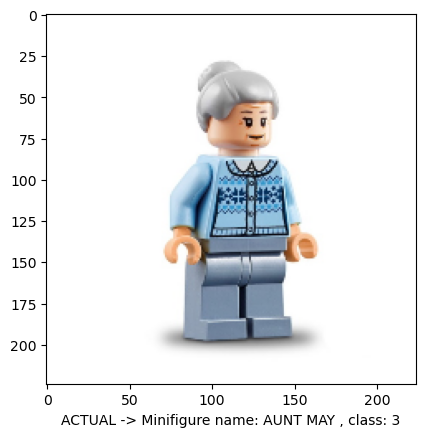

1/1 [==============================] - 0s 115ms/step
Class: 4 Minifigure: GHOST SPIDER


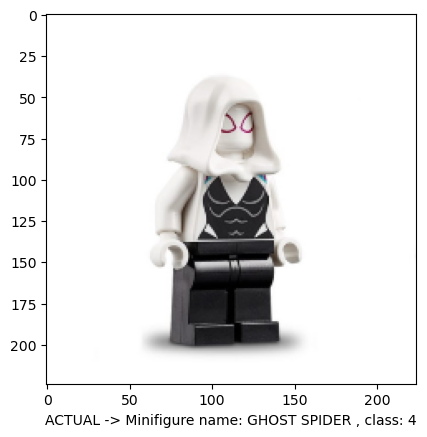

1/1 [==============================] - 0s 132ms/step
Class: 17 Minifigure: SPIDER-MAN


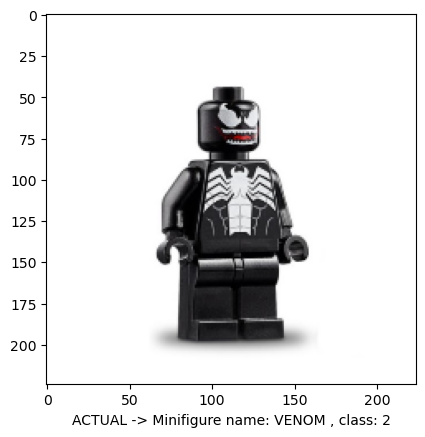

1/1 [==============================] - 0s 125ms/step
Class: 5 Minifigure: YODA


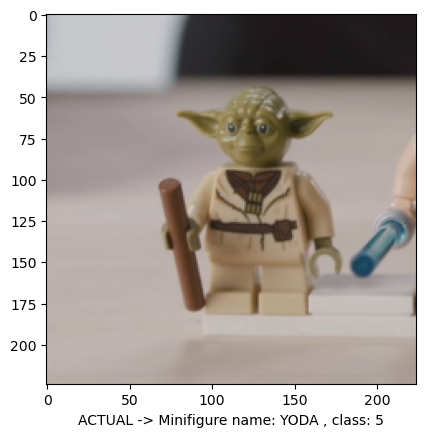

1/1 [==============================] - 0s 127ms/step
Class: 6 Minifigure: LUKE SKYWALKER


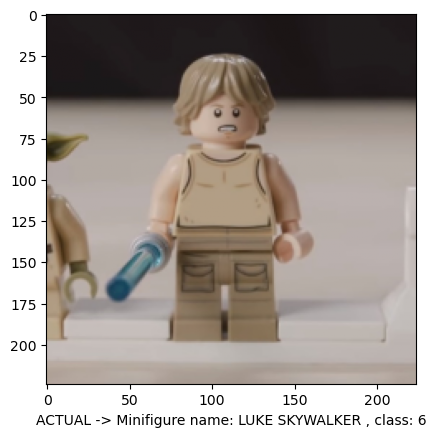

1/1 [==============================] - 0s 143ms/step
Class: 7 Minifigure: R2-D2


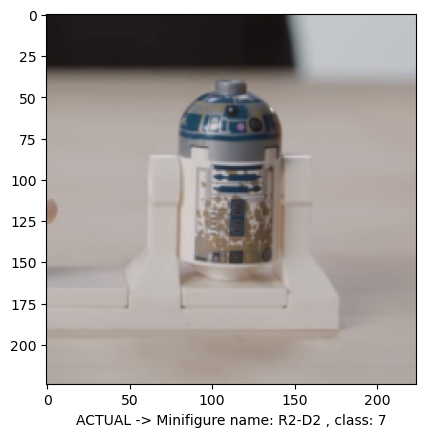

1/1 [==============================] - 0s 142ms/step
Class: 5 Minifigure: YODA


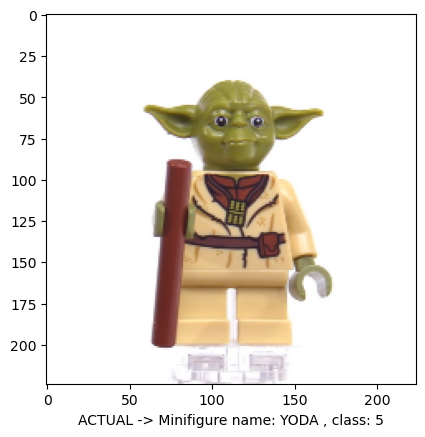

1/1 [==============================] - 0s 140ms/step
Class: 6 Minifigure: LUKE SKYWALKER


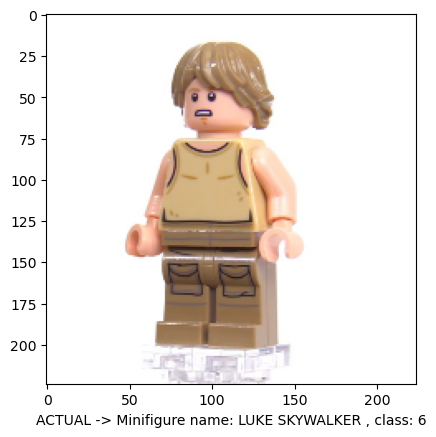

1/1 [==============================] - 0s 128ms/step
Class: 7 Minifigure: R2-D2


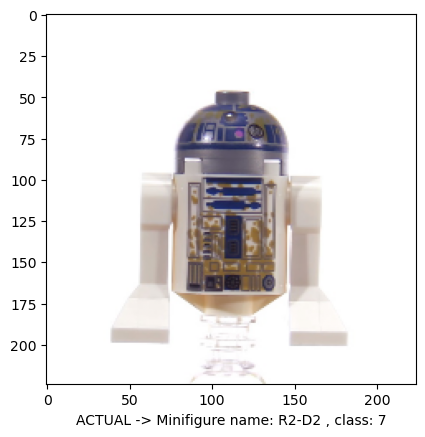

1/1 [==============================] - 0s 127ms/step
Class: 18 Minifigure: HARRY POTTER


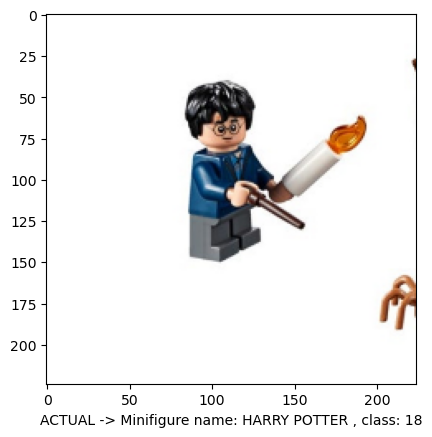

1/1 [==============================] - 0s 130ms/step
Class: 18 Minifigure: HARRY POTTER


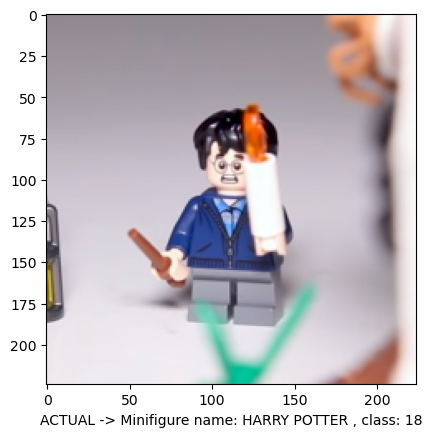

1/1 [==============================] - 0s 132ms/step
Class: 19 Minifigure: RON WEASLEY


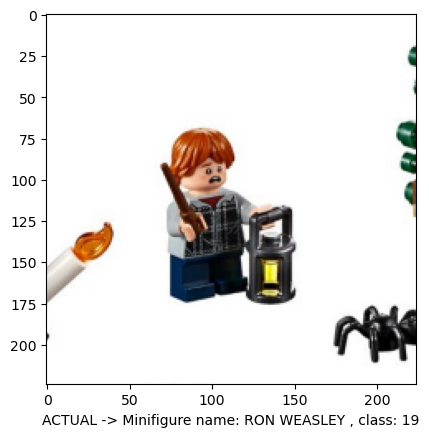

1/1 [==============================] - 0s 128ms/step
Class: 19 Minifigure: RON WEASLEY


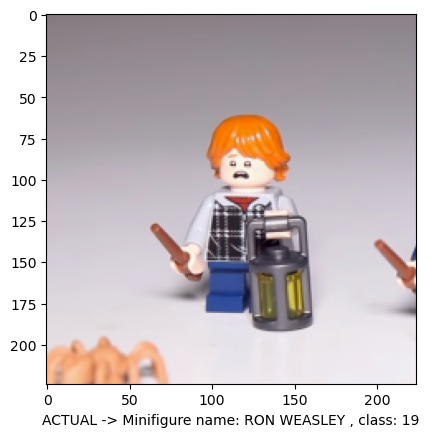

1/1 [==============================] - 0s 132ms/step
Class: 26 Minifigure: OWEN GRADY


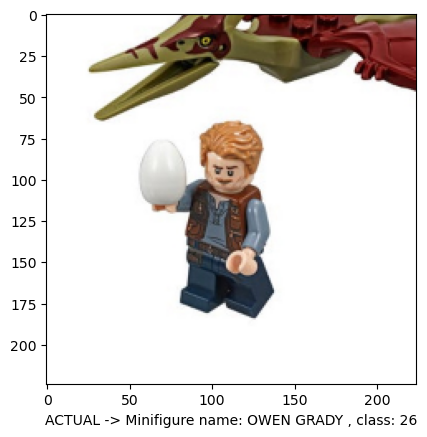

1/1 [==============================] - 0s 123ms/step
Class: 26 Minifigure: OWEN GRADY


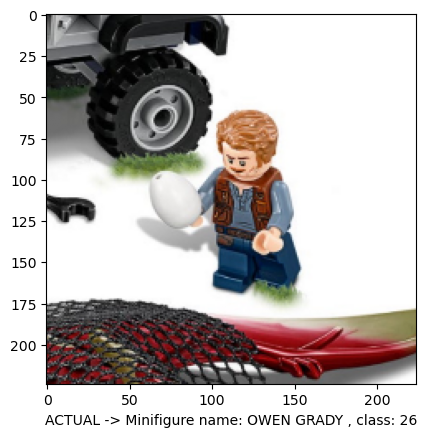

1/1 [==============================] - 0s 137ms/step
Class: 18 Minifigure: HARRY POTTER


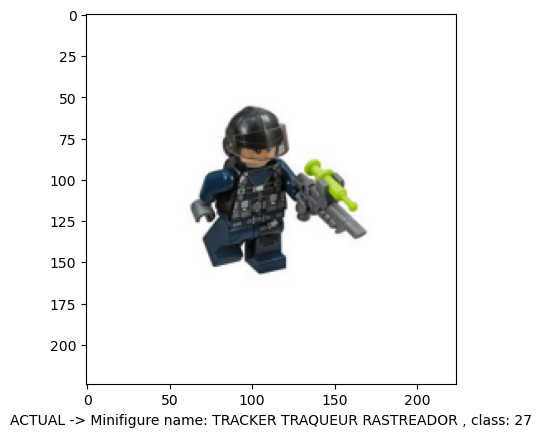

1/1 [==============================] - 0s 131ms/step
Class: 27 Minifigure: TRACKER TRAQUEUR RASTREADOR


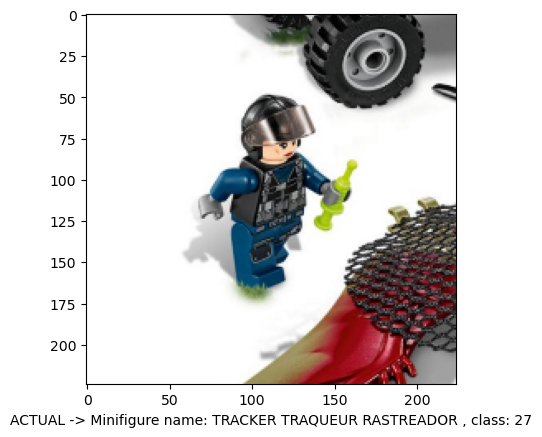

1/1 [==============================] - 0s 149ms/step
Class: 15 Minifigure: MYSTERIO


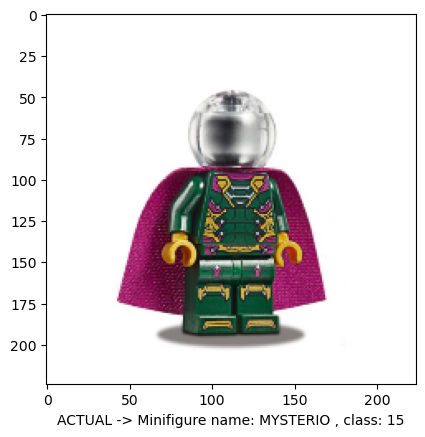

1/1 [==============================] - 0s 144ms/step
Class: 16 Minifigure: FIREFIGHTER


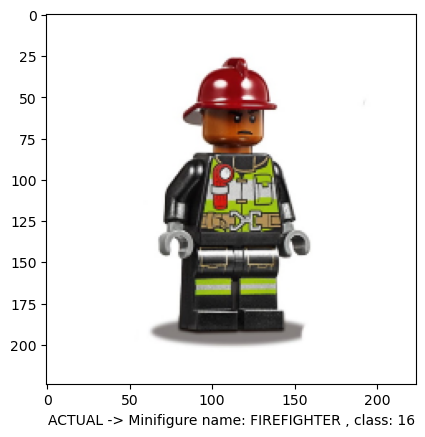

1/1 [==============================] - 0s 135ms/step
Class: 17 Minifigure: SPIDER-MAN


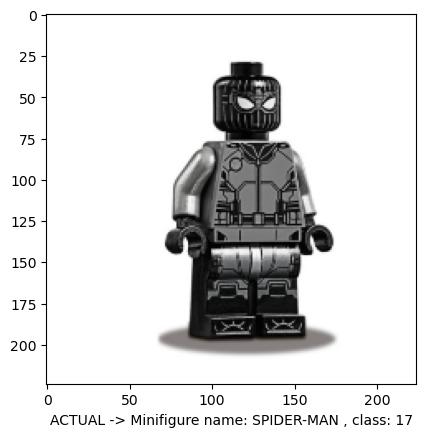

1/1 [==============================] - 0s 122ms/step
Class: 14 Minifigure: KLATOOINIAN RAIDER 2


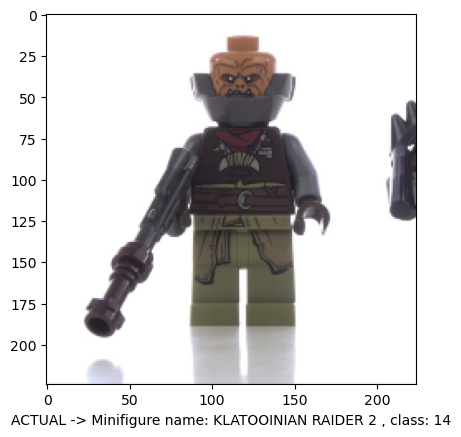

1/1 [==============================] - 0s 132ms/step
Class: 20 Minifigure: BLACK WIDOW


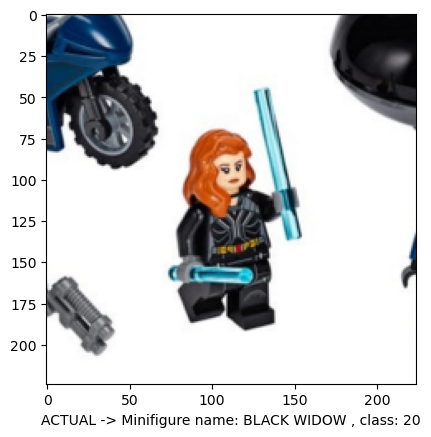

1/1 [==============================] - 0s 133ms/step
Class: 12 Minifigure: CARA DUNE


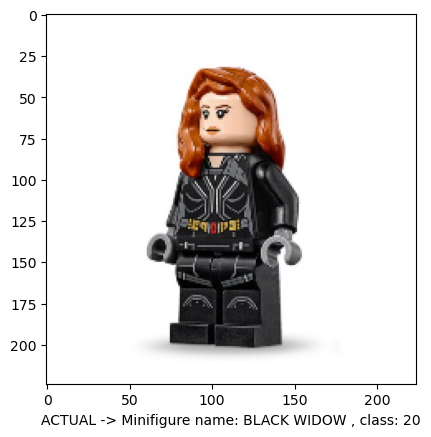

1/1 [==============================] - 0s 121ms/step
Class: 20 Minifigure: BLACK WIDOW


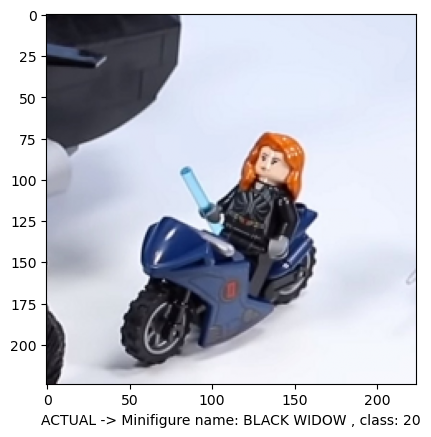

1/1 [==============================] - 0s 127ms/step
Class: 21 Minifigure: YELENA BELOVA


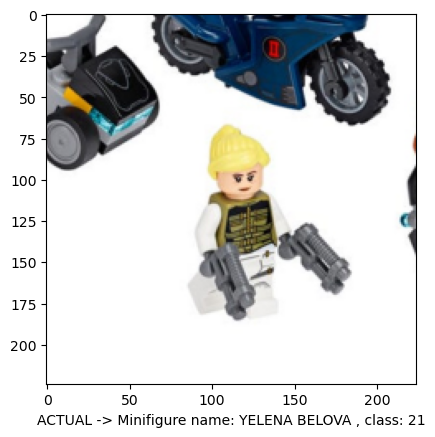

1/1 [==============================] - 0s 135ms/step
Class: 26 Minifigure: OWEN GRADY


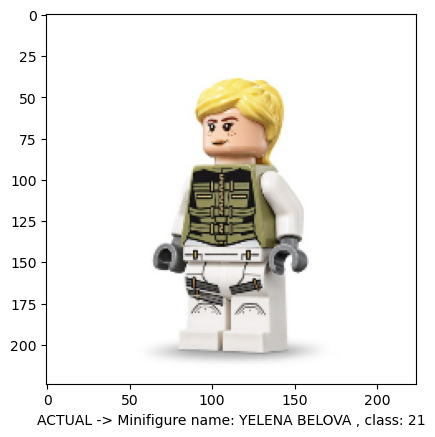

1/1 [==============================] - 0s 134ms/step
Class: 20 Minifigure: BLACK WIDOW


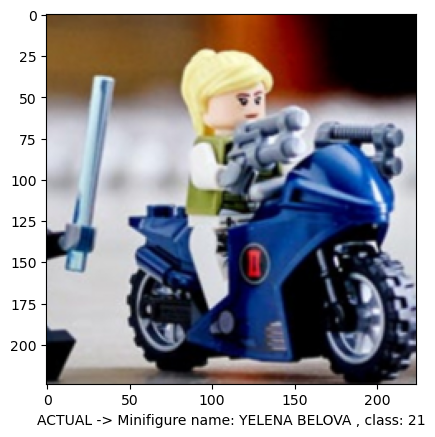

1/1 [==============================] - 0s 141ms/step
Class: 22 Minifigure: TASKMASTER


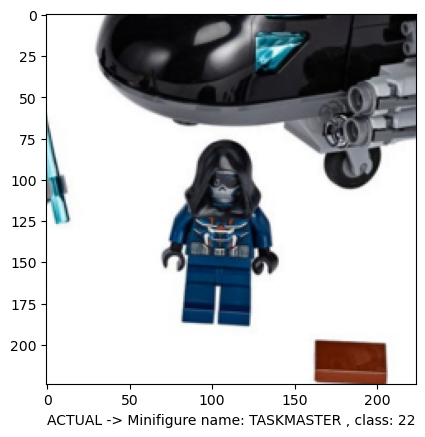

1/1 [==============================] - 0s 141ms/step
Class: 22 Minifigure: TASKMASTER


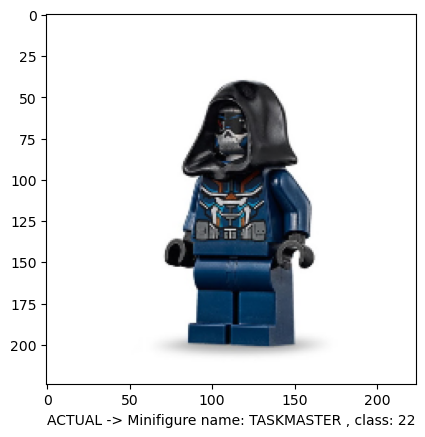

1/1 [==============================] - 0s 141ms/step
Class: 22 Minifigure: TASKMASTER


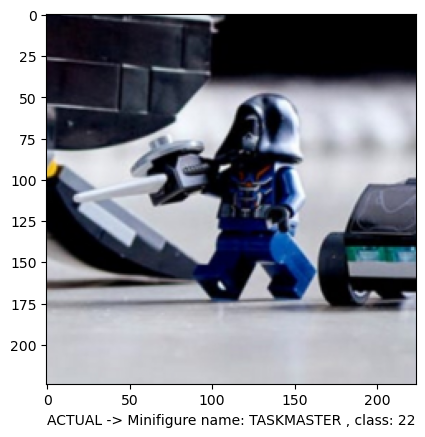

1/1 [==============================] - 0s 141ms/step
Class: 23 Minifigure: CAPTAIN AMERICA


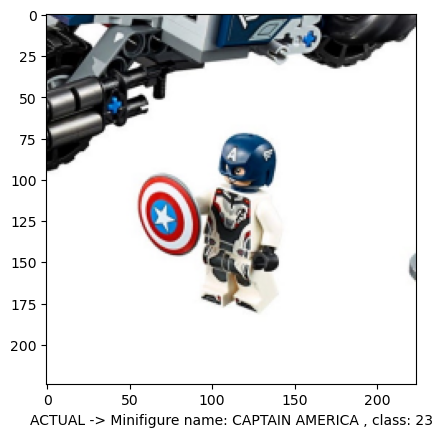

1/1 [==============================] - 0s 135ms/step
Class: 23 Minifigure: CAPTAIN AMERICA


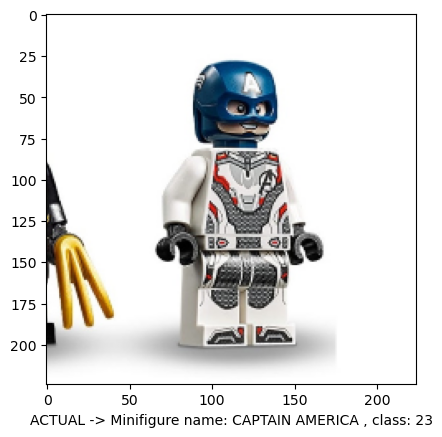

1/1 [==============================] - 0s 140ms/step
Class: 24 Minifigure: OUTRIDER 1


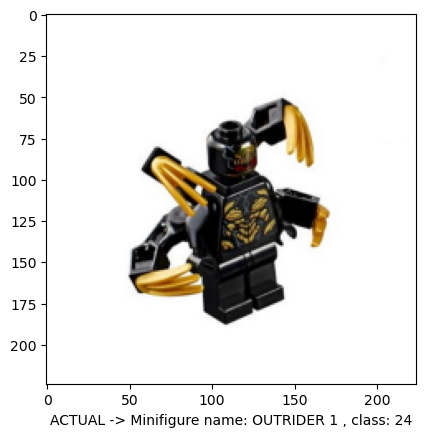

1/1 [==============================] - 0s 141ms/step
Class: 25 Minifigure: OUTRIDER 2


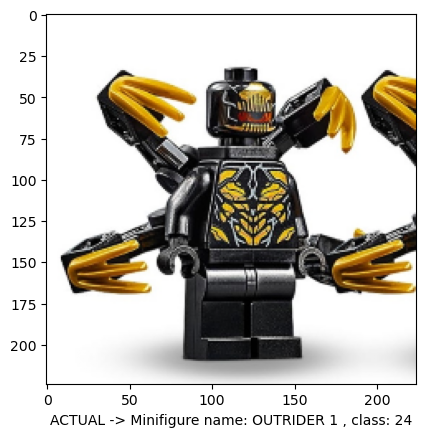

1/1 [==============================] - 0s 136ms/step
Class: 25 Minifigure: OUTRIDER 2


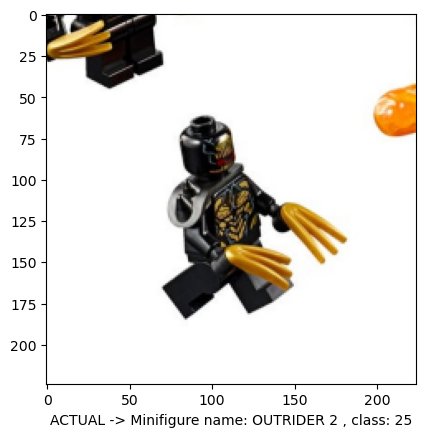

1/1 [==============================] - 0s 134ms/step
Class: 25 Minifigure: OUTRIDER 2


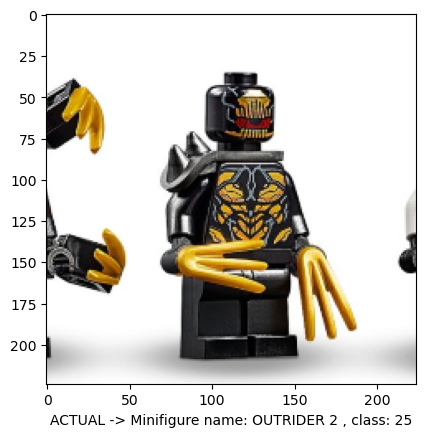

1/1 [==============================] - 0s 141ms/step
Class: 28 Minifigure: IRON MAN MK 1


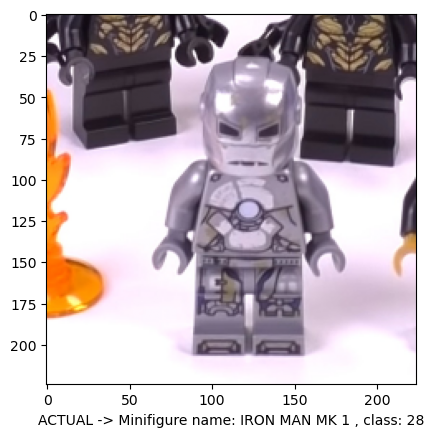

1/1 [==============================] - 0s 133ms/step
Class: 28 Minifigure: IRON MAN MK 1


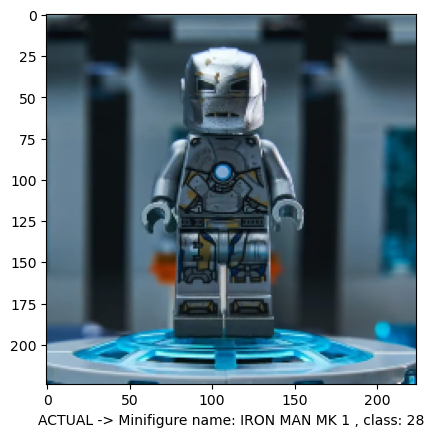

1/1 [==============================] - 0s 124ms/step
Class: 29 Minifigure: IRON MAN MK 5


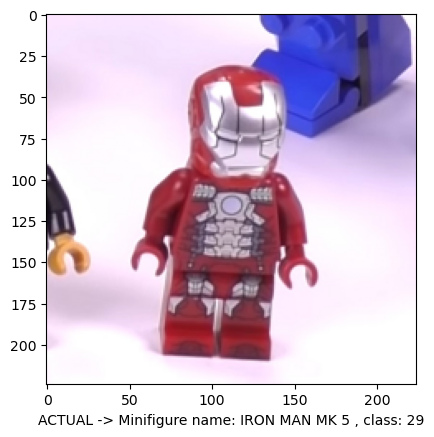

1/1 [==============================] - 0s 133ms/step
Class: 29 Minifigure: IRON MAN MK 5


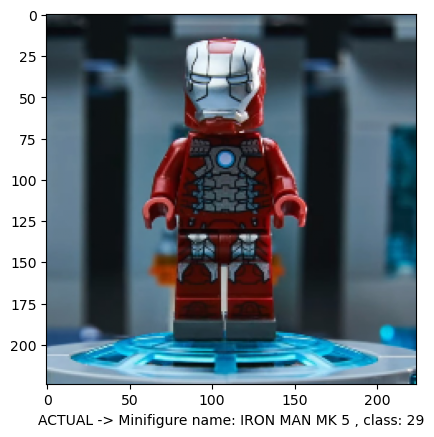

1/1 [==============================] - 0s 133ms/step
Class: 30 Minifigure: IRON MAN MK 41


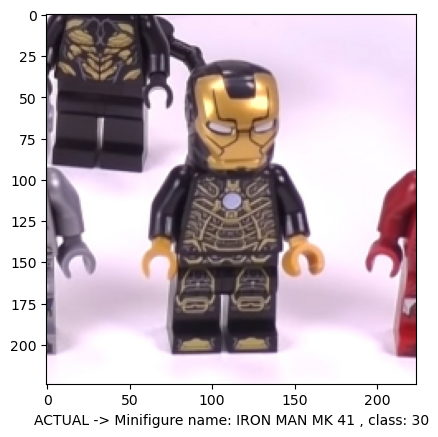

1/1 [==============================] - 0s 129ms/step
Class: 30 Minifigure: IRON MAN MK 41


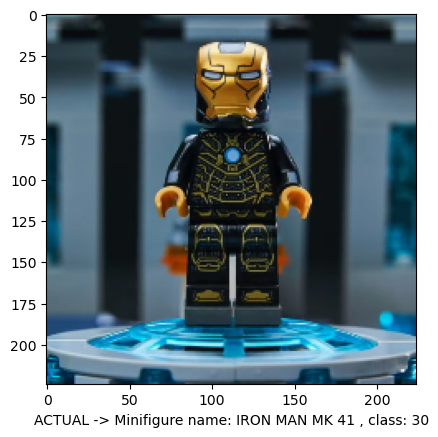

1/1 [==============================] - 0s 132ms/step
Class: 31 Minifigure: IRON MAN MK 50


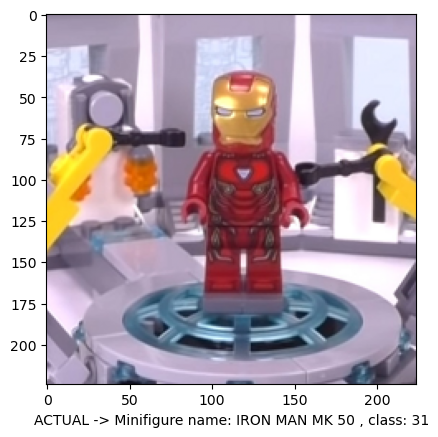

1/1 [==============================] - 0s 117ms/step
Class: 31 Minifigure: IRON MAN MK 50


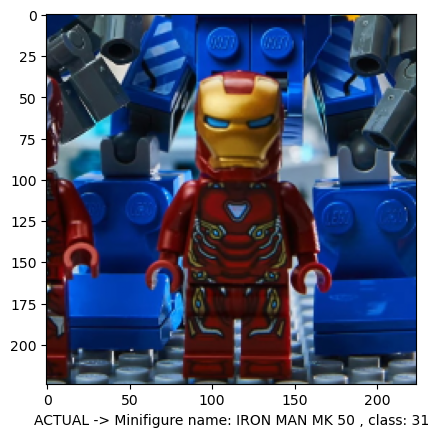

1/1 [==============================] - 0s 117ms/step
Class: 8 Minifigure: MACE WINDU


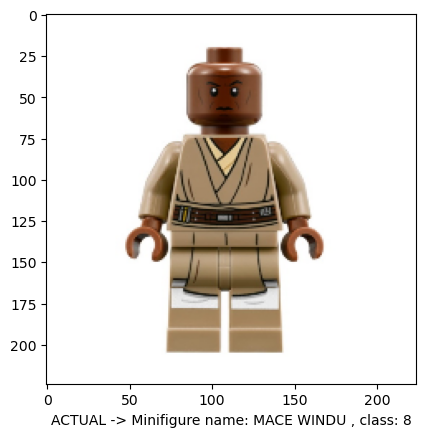

1/1 [==============================] - 0s 140ms/step
Class: 8 Minifigure: MACE WINDU


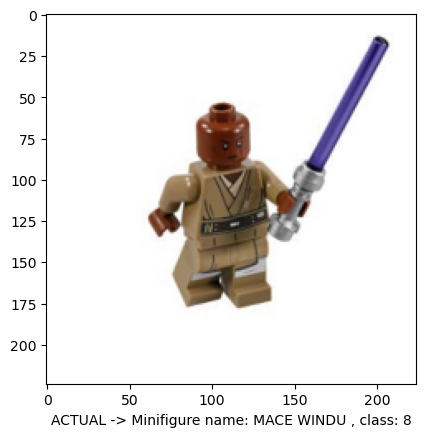

1/1 [==============================] - 0s 133ms/step
Class: 9 Minifigure: GENERAL GRIEVOUS


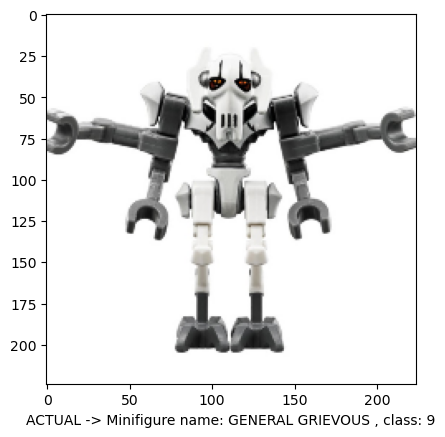

1/1 [==============================] - 0s 133ms/step
Class: 9 Minifigure: GENERAL GRIEVOUS


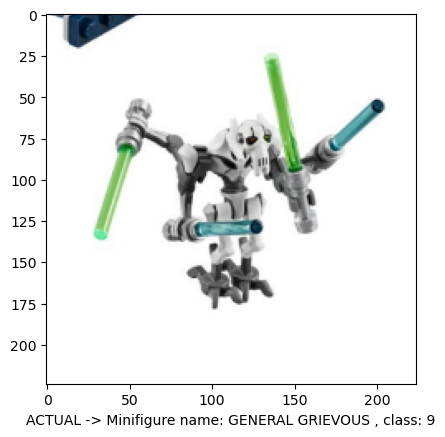

1/1 [==============================] - 0s 125ms/step
Class: 10 Minifigure: KYLO REN


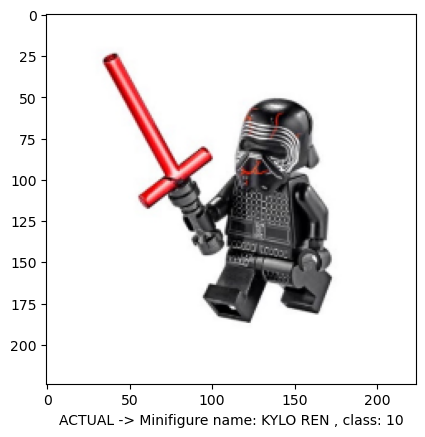

1/1 [==============================] - 0s 125ms/step
Class: 10 Minifigure: KYLO REN


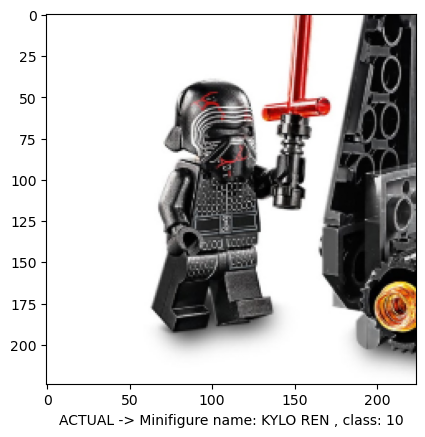

1/1 [==============================] - 0s 125ms/step
Class: 11 Minifigure: THE MANDALORIAN


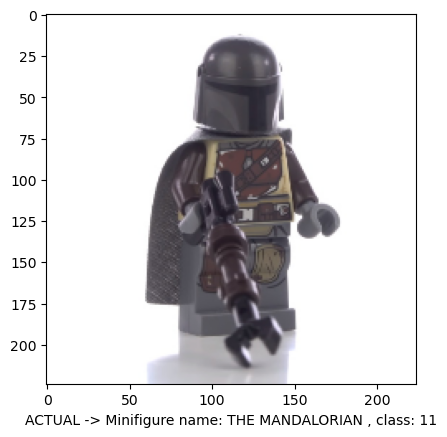

1/1 [==============================] - 0s 116ms/step
Class: 12 Minifigure: CARA DUNE


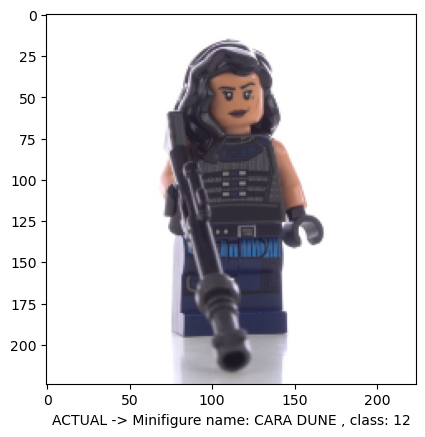

1/1 [==============================] - 0s 125ms/step
Class: 13 Minifigure: KLATOOINIAN RAIDER 1


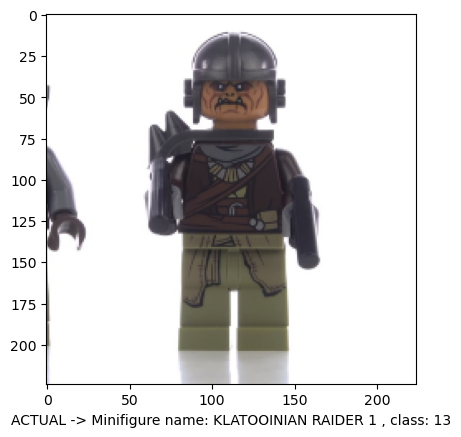

1/1 [==============================] - 0s 131ms/step
Class: 9 Minifigure: GENERAL GRIEVOUS


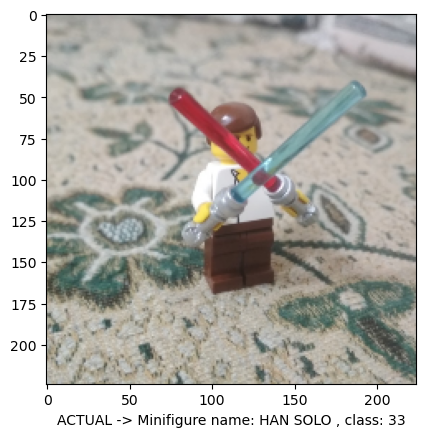

1/1 [==============================] - 0s 132ms/step
Class: 33 Minifigure: HAN SOLO


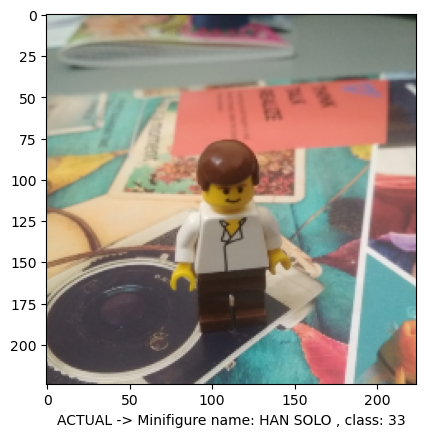

1/1 [==============================] - 0s 135ms/step
Class: 34 Minifigure: DARTH VADER


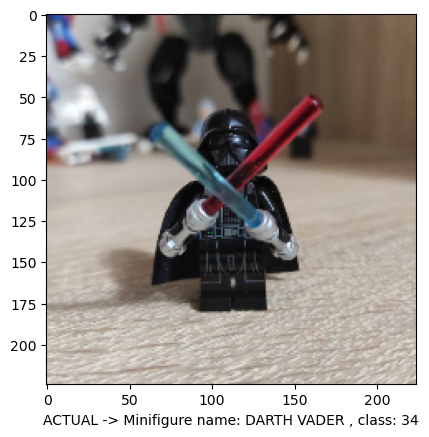

1/1 [==============================] - 0s 138ms/step
Class: 36 Minifigure: EMPEROR PALPATINE


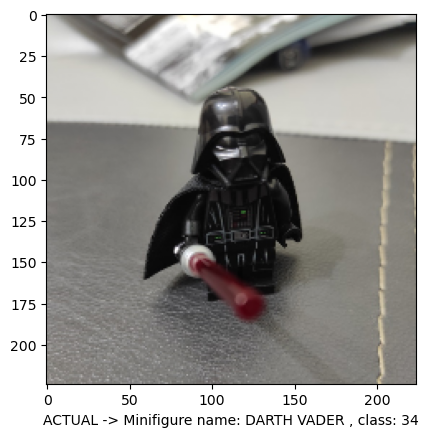

1/1 [==============================] - 0s 122ms/step
Class: 34 Minifigure: DARTH VADER


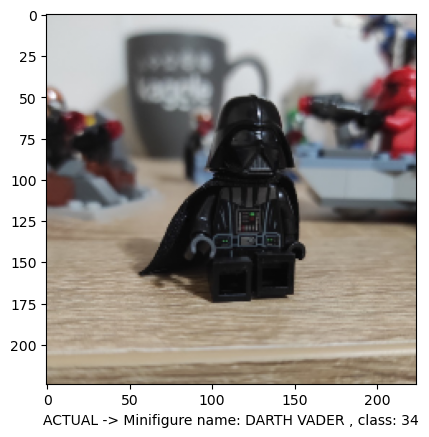

1/1 [==============================] - 0s 125ms/step
Class: 10 Minifigure: KYLO REN


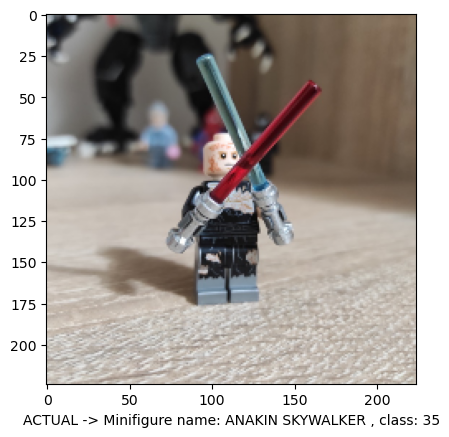

1/1 [==============================] - 0s 121ms/step
Class: 35 Minifigure: ANAKIN SKYWALKER


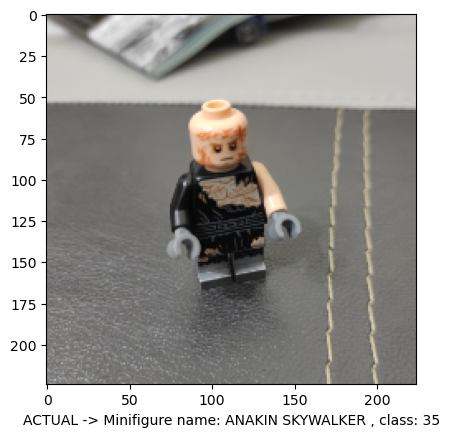

1/1 [==============================] - 0s 116ms/step
Class: 35 Minifigure: ANAKIN SKYWALKER


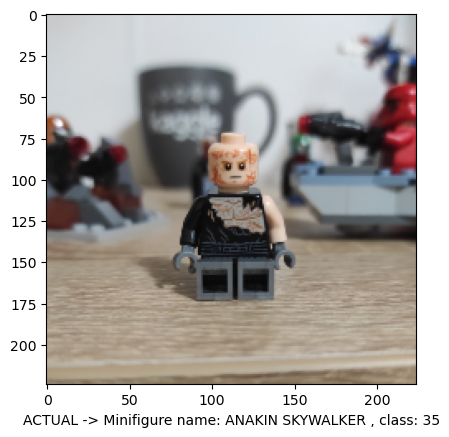

1/1 [==============================] - 0s 125ms/step
Class: 36 Minifigure: EMPEROR PALPATINE


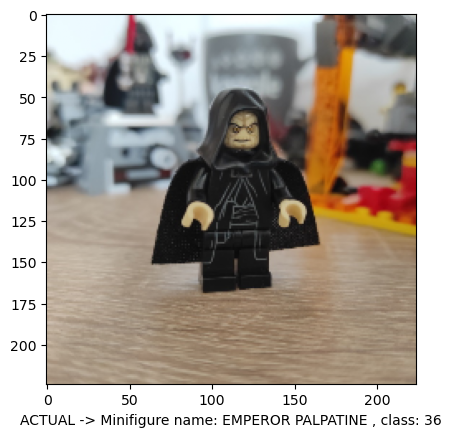

1/1 [==============================] - 0s 139ms/step
Class: 36 Minifigure: EMPEROR PALPATINE


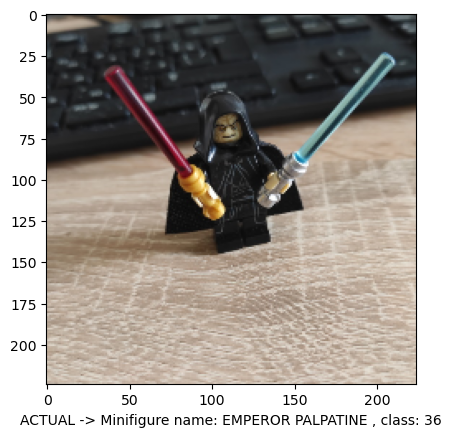

1/1 [==============================] - 0s 137ms/step
Class: 36 Minifigure: EMPEROR PALPATINE


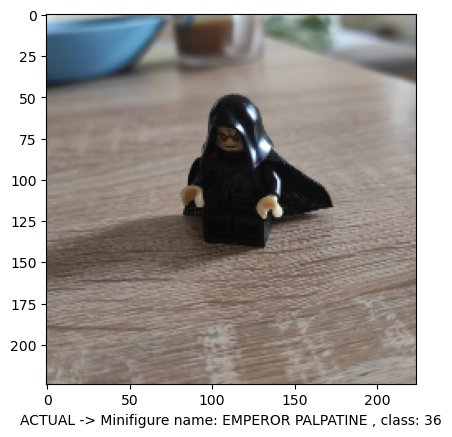

1/1 [==============================] - 0s 137ms/step
Class: 37 Minifigure: OBI-WAN KENOBI


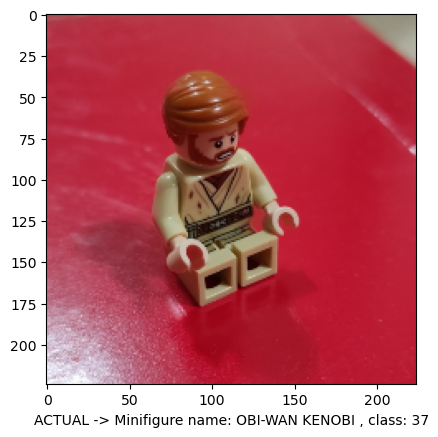

1/1 [==============================] - 0s 131ms/step
Class: 37 Minifigure: OBI-WAN KENOBI


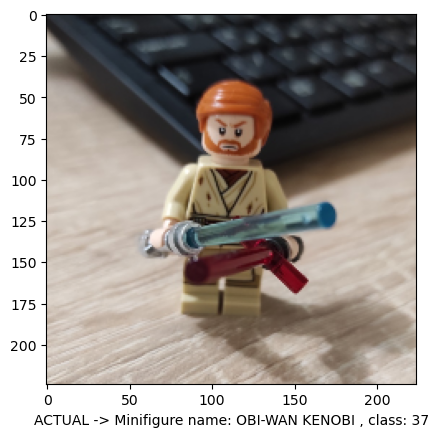

1/1 [==============================] - 0s 133ms/step
Class: 37 Minifigure: OBI-WAN KENOBI


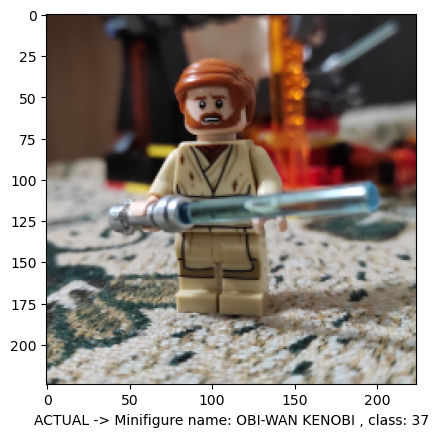

1/1 [==============================] - 0s 133ms/step
Class: 38 Minifigure: BOBA FETT


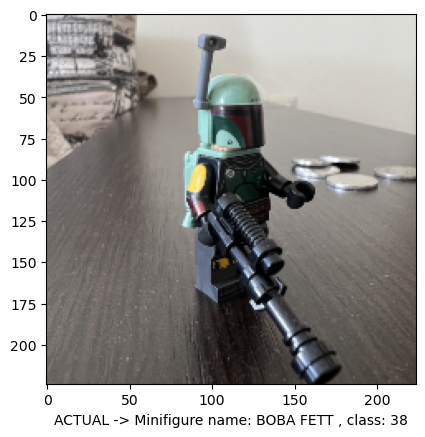

1/1 [==============================] - 0s 133ms/step
Class: 38 Minifigure: BOBA FETT


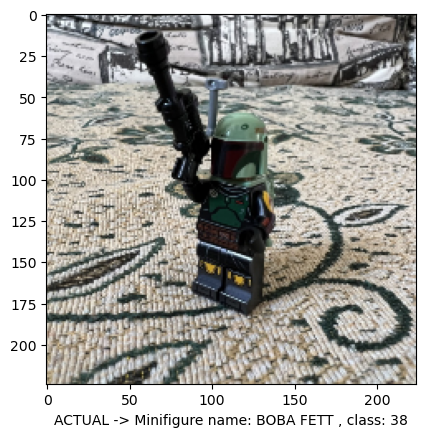

1/1 [==============================] - 0s 127ms/step
Class: 38 Minifigure: BOBA FETT


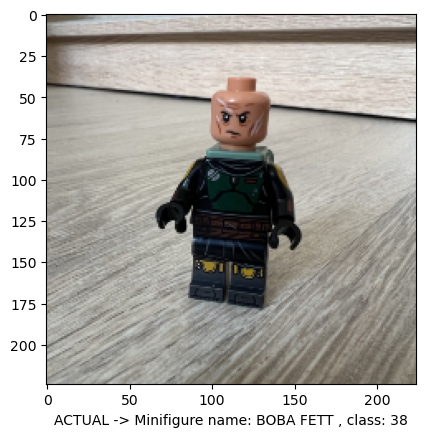

In [ ]:
for i in range(len(test_df)):

    image = cv2.imread(X_test['path'].values[i])
    image = cv2.resize(image, dsize=(224,224))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)/255
    plt.imshow(image)
    plt.xlabel('ACTUAL -> Minifigure name: ' + test_actual_df['minifigure_name'].values[i]+' , class: '+str(test_actual_df['class_id'].values[i]))
    image = np.reshape(image, (1, 224, 224, 3))
    ans = model.predict(image).argmax()
    ans = ans+1
    minifigure = metadata_df["minifigure_name"][metadata_df["class_id"] == ans].iloc[0]
    print("Class:", str(ans)+ " Minifigure:",minifigure)
    plt.show()

In [ ]:
loss, accuracy = model.evaluate(X_val_converted, y_val_converted, verbose=1)

print('Test loss:', loss)
print('Test accuracy:', accuracy)

3/3 [==============================] - 5s 933ms/step - loss: 0.5313 - accuracy: 0.9467
Test loss: 0.5312608480453491
Test accuracy: 0.9466666579246521
